# Data Degradation
Prepare noisy data for the models in the next notebooks.

## Libraries & Drive Access & some constants

In [1]:
!pip install astra-toolbox

import os
import sys
import time
import random
import shutil
import numpy as np
import torch
import torchvision
from pathlib import Path
from dataclasses import dataclass, field
from typing import List, Tuple, Any
from datasets import load_dataset, Dataset, DatasetDict, concatenate_datasets
from google.colab import drive
from PIL import Image

# for Data & Image check
import json
import math
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from datasets import load_from_disk, load_dataset_builder
from collections import Counter

drive.mount('/content/drive')
os.environ["CACHE"] = "/content/cache"

BASE_DIR = Path("/content/drive/MyDrive/Computational Imaging")
sys.path.append(str(BASE_DIR))

from IPPy.IPPy.operators import Blurring
import IPPy.IPPy.utilities as IPPy_utils

# Constants
DEVICE = IPPy_utils.get_device()
BATCHED = True
BATCH_SIZE = 128
INDICES = True

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 28.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.5/3.5 MB 54.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 200.9/200.9 MB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 39.7/39.7 MB 34.0 MB/s eta 0:00:00
Mounted at /content/drive


## Basic functions and configuration
Configurations of parameters like noise, type of blur, dataset and samples per class

In [2]:
@dataclass(frozen=True)
class Config:
  seed: int = 42
  dataset_name: str = "benjamin-paine/imagenet-1k-256x256"
  target_classes: List[int] = (0, 10, 100, 200) # default_factory with lambda to have each istance of Config it's own target_classes
  samples_per_class: int = 1300 #max

  drive_output_dir: Path = BASE_DIR / "dataset"

  # Forward operator parameters
  img_shape: Tuple[int, int, int] = (3, 256, 256) # img type, (C,H,W)
  blur_kernel_type: str = "gaussian"
  blur_kernel_size: int = 9
  blur_sigma: float = 2.0
  motion_angle: float = 45.0 # unused rn

  noise_levels: List[float] = (0.005, 0.01, 0.05, 0.1)
  device: str = DEVICE

def set_seed(seed: int = 42) -> None:
  """ Set seed for reproducibility """
  random.seed(seed)
  np.random.seed(seed)
  torch.manual_seed(seed)
  torch.cuda.manual_seed_all(seed)
  torch.backends.cudnn.deterministic = True
  torch.backends.cudnn.benchmark = False
  torch.use_deterministic_algorithms(True, warn_only=True)

# Image transformation
pil_to_tensor = torchvision.transforms.ToTensor()
tensor_to_pil = torchvision.transforms.ToPILImage()

## Forward Model

In [3]:
def forward_model( image_batch: dict[str, list[Any]],
                  indices: list[int], K: Blurring, noise_levels: list[float],
                   device: str, base_seed: int) -> dict[str, Any]:
  """
  Apply  y = K(x) + e

  Parameters:
    image_batch: series of BATCH_SIZE images from the dataset, in format { "image": [img1, ...], "label": [0, ...] }
    indices: list of indices of the images from the dataset, for assuring determinism later on in the function. List as image_batch are multiple images
    K: blurring operator
    noise_levels: list of config.noise_levels
    device: used for GPU or apple-cpu optimization, if available
    base_seed: assuring that different images(and level of noise) have different type of noise, but still deterministic
  """
  batch_images = image_batch.get("image", [])
  batch_size = len(batch_images)

  # in case of empty batches
  # if batch_size == 0:
  #     output_dict = {f"y_{int(round(sigma_n * 1000)):03d}": [] for sigma_n in noise_levels}
  #     output_dict["x"] = []
  #     return output_dict

  # convert into RGB in case it's not
  tensor_list = []
  for img in batch_images:
    if img.mode != "RGB":
      img = img.convert("RGB")
    tensor_list.append(pil_to_tensor(img))

  # blur
  x_batch = torch.stack(tensor_list).to(device).float()
  y_clean = K(x_batch)

  # noise
  output_dict = {f"y_{int(round(sigma_n * 1000)):03d}": [] for sigma_n in noise_levels}
  output_dict["x"] = batch_images

  for i, idx in enumerate(indices):
    img_clean = y_clean[i]

    for sigma_n in noise_levels:
      # specific seed for each image, should be enough to not have collisions
      torch.manual_seed(base_seed + idx + int(sigma_n * 1000))

      y_noisy = img_clean + IPPy_utils.gaussian_noise(img_clean, sigma_n)

      y_noisy_uint8 = (y_noisy * 255.0).clamp(0, 255).to(torch.uint8)
      y_noisy_pil = tensor_to_pil(y_noisy_uint8.cpu())

      key = f"y_{int(round(sigma_n * 1000)):03d}"
      output_dict[key].append(y_noisy_pil)

  return output_dict

## Dataset loading and preprocessing

In [ ]:
config = Config()
set_seed(config.seed)

# definition of the blur operator
blur = Blurring(
  img_shape=config.img_shape,
  kernel_type=config.blur_kernel_type,
  kernel_size=config.blur_kernel_size,
  kernel_variance=config.blur_sigma**2
)

# reading train part of the dataset, collecting samples until config.samples_per_class is satisfied
iterable_ds = load_dataset(config.dataset_name, split="train", streaming=True)
class_datasets = []
for cls in config.target_classes:
  cls_iter = iterable_ds.filter(lambda x, c=cls: x["label"] == c)
  cls_ds = Dataset.from_generator(
      lambda s=cls_iter.take(config.samples_per_class): (yield from s),
      features=iterable_ds.features
  )
  class_datasets.append(cls_ds)
ds = concatenate_datasets(class_datasets)

# doing the degradation
ds_degraded = ds.map(
  forward_model,
  batched=BATCHED,
  batch_size=BATCH_SIZE,
  with_indices=INDICES,
  remove_columns=["image"],
  fn_kwargs={
    "K": blur,
    "noise_levels": config.noise_levels,
    "device": config.device,
    "base_seed": config.seed
  }
)

Resolving data files:   0%|          | 0/40 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/40 [00:00<?, ?it/s]

## Data separation & saving

In [ ]:
# splitting the dataset into train 80% - validation 10% - testing 10%
train_test_split = ds_degraded.train_test_split(test_size=0.2, seed=config.seed, stratify_by_column="label")
val_test_split = train_test_split['test'].train_test_split(test_size=0.5, seed=config.seed, stratify_by_column="label")

final_dataset = DatasetDict({
  'train': train_test_split['train'],
  'validation': val_test_split['train'],
  'test': val_test_split['test']
})

# saving into drive
config.drive_output_dir.mkdir(parents=True, exist_ok=True)
final_dataset.save_to_disk(str(config.drive_output_dir))

# saving the class names
builder = load_dataset_builder(config.dataset_name)
class_names = builder.info.features["label"].names
id2label = {cls: class_names[cls] for cls in config.target_classes}
with open(config.drive_output_dir / "labels.json", "w") as f:
    json.dump(id2label, f, indent=2)

Saving the dataset (0/4 shards):   0%|          | 0/4160 [00:00<?, ? examples/s]

Saving the dataset (0/1 shards):   0%|          | 0/520 [00:00<?, ? examples/s]

Saving the dataset (0/1 shards):   0%|          | 0/520 [00:00<?, ? examples/s]

Resolving data files:   0%|          | 0/40 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/40 [00:00<?, ?it/s]

## Data & Image check

Dataset caricato da: /content/drive/MyDrive/Computational Imaging/dataset


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:112: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


README.md:   0%|          | 0.00/88.1k [00:00<?, ?B/s]

Resolving data files:   0%|          | 0/40 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/40 [00:00<?, ?it/s]

=== Split sizes ===
       train:  4160 samples
  validation:   520 samples
        test:   520 samples
       TOTAL:  5200 samples

=== Label distribution ===
  train: {0: 1040, 10: 1040, 100: 1040, 200: 1040}
  validation: {0: 130, 10: 130, 100: 130, 200: 130}
  test: {0: 130, 10: 130, 100: 130, 200: 130}

=== Columns ===
  ['label', 'y_005', 'y_010', 'y_050', 'y_100', 'x']

=== Pixel value ranges (first 5 train samples) ===
  x: min=0, max=255, dtype=uint8
  y_005: min=0, max=255, dtype=uint8
  y_010: min=0, max=255, dtype=uint8
  y_050: min=0, max=255, dtype=uint8
  y_100: min=0, max=255, dtype=uint8

=== Noise level verification (mean over 20 samples) ===
  y_005: expected=0.005  measured=0.0026 ± 0.0004
  y_010: expected=0.010  measured=0.0046 ± 0.0008
  y_050: expected=0.050  measured=0.0221 ± 0.0040
  y_100: expected=0.100  measured=0.0439 ± 0.0078

=== Blur MSE ===
Blur MSE: 0.005527446512132883

=== Image Shape ===
x (256, 256, 3)
y_005 (256, 256, 3)
y_010 (256, 256, 3)
y_050

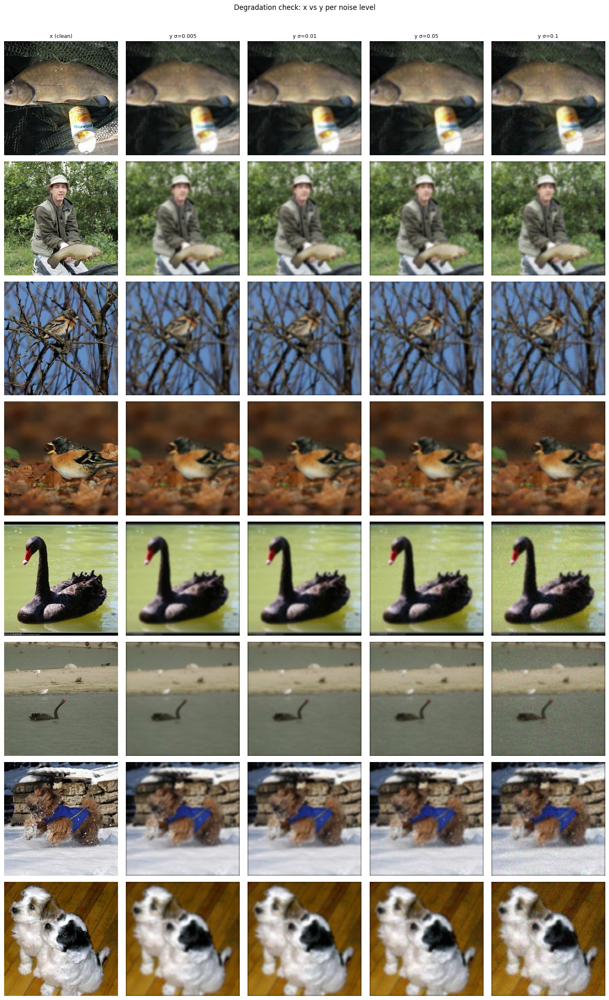

In [4]:
try:
  # if this is executed right after the cells above, i do not need to re-define variables
  config
except NameError:
  print("==================================")
  # if "Dataset loading and preprocessing" and "Data separation & Saving" cells are not executed
  config = Config()
  set_seed(config.seed)

  blur = Blurring(
    img_shape=config.img_shape,
    kernel_type=config.blur_kernel_type,
    kernel_size=config.blur_kernel_size,
    kernel_variance=config.blur_sigma**2
  )

  final_dataset = load_from_disk(str(config.drive_output_dir))
  print(f"Dataset caricato da: {config.drive_output_dir}")


  # Per mantenere lo stato dell'ambiente perfettamente coerente, uniamo i vari
  # split di final_dataset per ricreare la variabile ds_degraded
  from datasets import concatenate_datasets
  ds_degraded = concatenate_datasets([
      final_dataset['train'],
      final_dataset['validation'],
      final_dataset['test']
  ])


# Leggiamo i metadata del dataset così queste variabili esistono sempre nell'ambiente
builder = load_dataset_builder(config.dataset_name)
class_names = builder.info.features["label"].names

# for label of the class used
if (config.drive_output_dir / "labels.json").exists():
  # reading from the file on drive
  with open(config.drive_output_dir / "labels.json") as f:
    id2label = json.load(f)
    id2label = {int(k): v for k, v in id2label.items()}
else:
  # reading from the official dataset
  id2label = {cls: class_names[cls] for cls in config.target_classes}

print("=== Split sizes ===")
for split, ds_split in final_dataset.items():
  print(f"  {split:>10}: {len(ds_split):>5} samples")

total = sum(len(v) for v in final_dataset.values())
print(f"  {'TOTAL':>10}: {total:>5} samples")

print("\n=== Label distribution ===")
for split, ds_split in final_dataset.items():
  counts = Counter(ds_split['label'])
  print(f"  {split}: { {k: counts[k] for k in sorted(counts)} }")

print("\n=== Columns ===")
print(" ", final_dataset['train'].column_names)

print("\n=== Pixel value ranges (first 5 train samples) ===")
sample = final_dataset['train'].select(range(5))
for col in ['x'] + [f"y_{int(round(sigma_n * 1000)):03d}" for sigma_n in config.noise_levels]:
  vals = [np.array(img) for img in sample[col]]
  arr = np.stack(vals)
  print(f"  {col}: min={arr.min()}, max={arr.max()}, dtype={arr.dtype}")

#  verify ||e|| / ||Kx|| ≈ sigma_n for each level of noise
print("\n=== Noise level verification (mean over 20 samples) ===")
sample = final_dataset['train'].select(range(20))

x_tensors   = torch.stack([pil_to_tensor(img) for img in sample['x']]).float().to(config.device)
y_clean_est = blur(x_tensors)  # Kx

for sigma_n in config.noise_levels:
  key = f"y_{int(round(sigma_n * 1000)):03d}"
  y_tensors = torch.stack([pil_to_tensor(img) for img in sample[key]]).float().to(config.device)
  noise     = y_tensors - y_clean_est
  measured_sigma = noise.std(dim=(1, 2, 3))
  print(f"  {key}: expected={sigma_n:.3f}  measured={measured_sigma.mean():.4f} ± {measured_sigma.std():.4f}")

print("\n=== Blur MSE ===")
mse = ((x_tensors - y_clean_est) ** 2).mean()
print("Blur MSE:", mse.item())

print("\n=== Image Shape ===")
sample = final_dataset["train"][0]

for key in ["x"] + [
    f"y_{int(round(s*1000)):03d}"
    for s in config.noise_levels
]:
    print(key, np.array(sample[key]).shape)

# === Plotting ===
cols_to_show = ['x'] + [f"y_{int(round(s*1000)):03d}" for s in config.noise_levels]
titles       = ['x (clean)', *[f"y σ={s}" for s in config.noise_levels]]
n_per_class  = 2

n_rows = len(config.target_classes) * n_per_class
n_cols = len(cols_to_show)

fig, axes = plt.subplots(
    n_rows, n_cols,
    figsize=(n_cols * 3, n_rows * 3)
)

labels_array = np.array(final_dataset['train']['label'])

row = 0
for cls in config.target_classes:
    all_indices = np.where(labels_array == cls)[0][:n_per_class].tolist()

    for idx in all_indices:
        sample_row = final_dataset['train'][int(idx)]
        for col_i, col in enumerate(cols_to_show):
            ax = axes[row][col_i]
            ax.imshow(sample_row[col])
            ax.axis('off')
            if col_i == 0:
                ax.set_ylabel(f"{id2label[cls]}", fontsize=9, rotation=90, labelpad=4)
            if row == 0:
                ax.set_title(titles[col_i], fontsize=9)
        row += 1

plt.suptitle("Degradation check: x vs y per noise level", fontsize=12, y=1.01)
plt.tight_layout()
plt.savefig(str(config.drive_output_dir / "image_check.png"), dpi=100, bbox_inches='tight')
plt.show()

## TpV Function + Test On One Image

This cell contains the definition of the tpv method for solving the deblur and denoise problem. This cell contains also a test of the method on one image

Avvio Ottimizzazione TpV...



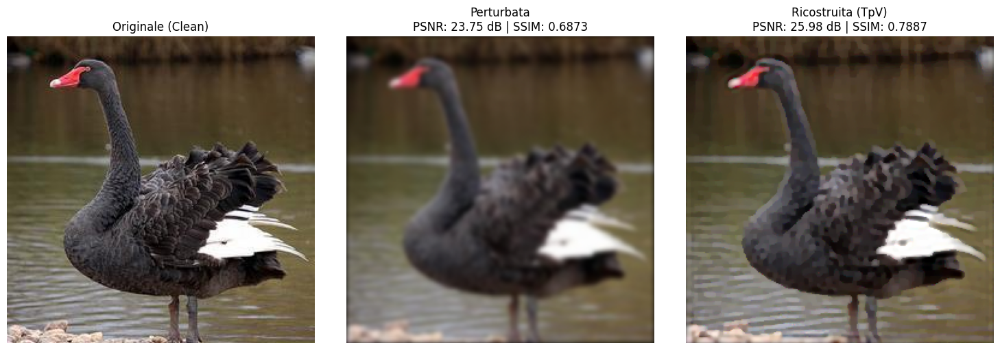

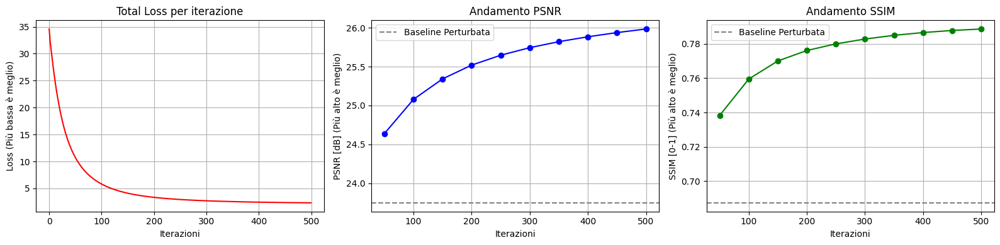

In [40]:
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np
# Importiamo skimage per il calcolo delle metriche
from skimage.metrics import structural_similarity as ssim_metric
from skimage.metrics import peak_signal_noise_ratio as psnr_metric
def total_p_variation_loss(img, p=1.0):
    """ Calcola la Total p-Variation dell'immagine """
    diff_h = torch.abs(img[:, :, 1:, :] - img[:, :, :-1, :])
    diff_w = torch.abs(img[:, :, :, 1:] - img[:, :, :, :-1])

    tv_h = torch.pow(diff_h + 1e-8, p).sum()
    tv_w = torch.pow(diff_w + 1e-8, p).sum()
    return tv_h + tv_w
def compute_metrics(x_pred, x_true):
    """
    Calcola PSNR e SSIM tra due tensori PyTorch (assumendo B=1)
    """
    # Spostiamo i tensori in CPU e li convertiamo in numpy format (H, W, C)
    img_pred = x_pred[0].cpu().detach().permute(1, 2, 0).numpy()
    img_true = x_true[0].cpu().detach().permute(1, 2, 0).numpy()

    # L'immagine è nel range [0, 1] data la normalizzazione iniziale
    psnr_val = psnr_metric(img_true, img_pred, data_range=1.0)
    # channel_axis=-1 comunica che i canali RGB sono nell'ultima dimensione
    ssim_val = ssim_metric(img_true, img_pred, data_range=1.0, channel_axis=-1)

    return psnr_val, ssim_val
def deblur_denoise_tpv(y, K, x_clean=None, lambda_tpv=0.01, p=1.0, num_iters=500, lr=0.01, device='cuda'):
    """ Risolve il problema inverso e traccia le metriche di performance. """
    x = y.clone().detach().to(device)
    x.requires_grad_(True)

    optimizer = torch.optim.Adam([x], lr=lr)

    # Dizionario per memorizzare la "storia" dell'ottimizzazione
    history = {'loss': [], 'psnr': [], 'ssim': [], 'iters': []}

    for i in range(num_iters):
        optimizer.zero_grad()

        y_hat = K(x)
        data_loss = 0.5 * F.mse_loss(y_hat, y, reduction='sum')
        tv_loss = total_p_variation_loss(x, p=p)

        loss = data_loss + lambda_tpv * tv_loss
        loss.backward()
        optimizer.step()

        with torch.no_grad():
            x.clamp_(0, 1)

        # Tracciamo la Loss ad ogni step
        history['loss'].append(loss.item())

        # Calcoliamo le metriche visive ogni 50 iterazioni e all'ultima iterazione
        if (i + 1) % (num_iters//10) == 0 or i == num_iters - 1:
            if x_clean is not None:
                psnr_val, ssim_val = compute_metrics(x, x_clean)

                history['iters'].append(i + 1)
                history['psnr'].append(psnr_val)
                history['ssim'].append(ssim_val)

                #print(f"Iter {(i + 1):04d}/{num_iters} | Loss: {loss.item():.4f} | PSNR: {psnr_val:.2f} dB | SSIM: {ssim_val:.4f}")
            else:
                print(f"Iter {(i + 1):04d}/{num_iters} | Loss: {loss.item():.4f}")

    return x.detach(), history
# ==========================================
# ESECUZIONE, TRACCIAMENTO METRICHE E PLOT
# ==========================================

noise_key = 'y_005'

# 1. Recupero 1 immagine (es: sample 0) e creo i tensori
sample = ds_degraded[2]
# Nota: usiamo le tue funzioni `pil_to_tensor` già definite nel notebook
y_noisy = pil_to_tensor(sample[noise_key]).unsqueeze(0).to(DEVICE)
x_clean = pil_to_tensor(sample['x']).unsqueeze(0).to(DEVICE)
print("Avvio Ottimizzazione TpV...\n")
x_reconstructed, history = deblur_denoise_tpv(
      y=y_noisy,
      K=blur,
      x_clean=x_clean,
      lambda_tpv=0.00005,
      p=0.5,
      num_iters=500,
      lr=0.001,
      device=DEVICE
  )
# 2. PLOT DELLE IMMAGINI
img_clean_np = x_clean[0].cpu().permute(1, 2, 0).numpy()
img_noisy_np = y_noisy[0].cpu().permute(1, 2, 0).numpy()
img_recon_np = x_reconstructed[0].cpu().permute(1, 2, 0).numpy()
# Calcoliamo le metriche della baseline perturbata (Punto di partenza)
psnr_start, ssim_start = compute_metrics(y_noisy, x_clean)
fig, axs = plt.subplots(1, 3, figsize=(15, 5))
axs[0].imshow(img_clean_np)
axs[0].set_title('Originale (Clean)')
axs[0].axis('off')
axs[1].imshow(img_noisy_np)
axs[1].set_title(f"Perturbata\nPSNR: {psnr_start:.2f} dB | SSIM: {ssim_start:.4f}")
axs[1].axis('off')
axs[2].imshow(img_recon_np)
axs[2].set_title(f"Ricostruita (TpV)\nPSNR: {history['psnr'][-1]:.2f} dB | SSIM: {history['ssim'][-1]:.4f}")
axs[2].axis('off')
plt.tight_layout()
plt.show()
# 3. PLOT DELL'ANDAMENTO DELLE METRICHE
fig, axs = plt.subplots(1, 3, figsize=(16, 4))
axs[0].plot(history['loss'], color='red')
axs[0].set_title('Total Loss per iterazione')
axs[0].set_xlabel('Iterazioni')
axs[0].set_ylabel('Loss (Più bassa è meglio)')
axs[0].grid(True)
axs[1].plot(history['iters'], history['psnr'], marker='o', color='blue')
axs[1].axhline(y=psnr_start, color='gray', linestyle='--', label='Baseline Perturbata')
axs[1].set_title('Andamento PSNR')
axs[1].set_xlabel('Iterazioni')
axs[1].set_ylabel('PSNR [dB] (Più alto è meglio)')
axs[1].legend()
axs[1].grid(True)
axs[2].plot(history['iters'], history['ssim'], marker='o', color='green')
axs[2].axhline(y=ssim_start, color='gray', linestyle='--', label='Baseline Perturbata')
axs[2].set_title('Andamento SSIM')
axs[2].set_xlabel('Iterazioni')
axs[2].set_ylabel('SSIM [0-1] (Più alto è meglio)')
axs[2].legend()
axs[2].grid(True)
plt.tight_layout()
plt.show()

## 2D "p" Evaluation Over One Image
with "lmbda_tpv" fixed

Avvio Tuning del parametro 'p' sull'immagine con rumore y_100...

--- Ottimizzazione con p = 0.10 ---
--- Ottimizzazione con p = 0.14 ---
--- Ottimizzazione con p = 0.19 ---
--- Ottimizzazione con p = 0.23 ---
--- Ottimizzazione con p = 0.28 ---
--- Ottimizzazione con p = 0.32 ---
--- Ottimizzazione con p = 0.37 ---
--- Ottimizzazione con p = 0.41 ---
--- Ottimizzazione con p = 0.46 ---
--- Ottimizzazione con p = 0.50 ---


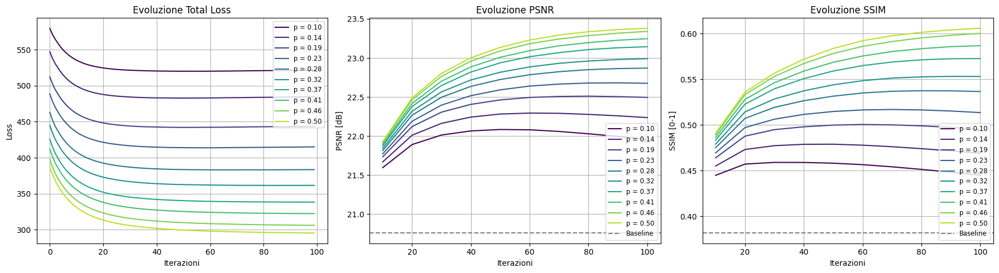

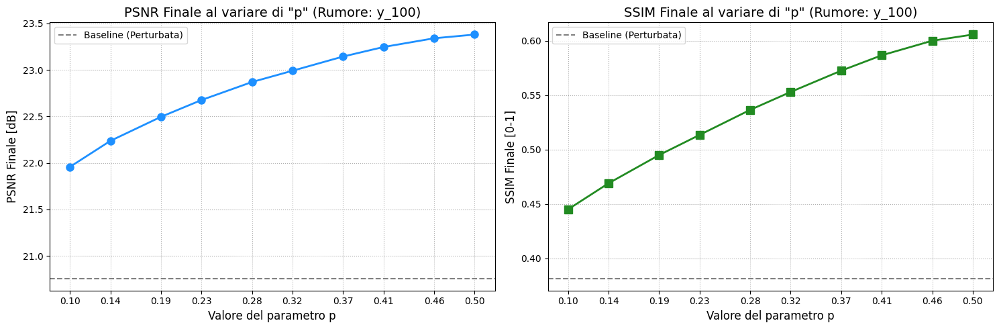

In [19]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm

# ==========================================
# ESECUZIONE MULTIPLA PER IL TUNING DI p
# ==========================================
# 1. Recupero 1 immagine e preparo il Ground Truth
sample = ds_degraded[1]
x_clean = pil_to_tensor(sample['x']).unsqueeze(0).to(DEVICE).float()

# Fissiamo il livello di rumore su cui fare il tuning
#noise_key = 'y_050'
y_noisy = pil_to_tensor(sample[noise_key]).unsqueeze(0).to(DEVICE).float()

# Calcoliamo le metriche di partenza
psnr_start, ssim_start = compute_metrics(y_noisy, x_clean)

# Generiamo i valori di p da 0.1 a 0.5 con passo 0.05
# Usiamo round per evitare strani difetti di floating point di Python
p_values = np.linspace(0.1, 0.5, 10)

for i in range(len(p_values)):
  p_values[i] = round(p_values[i],2)

results_p = {}

print(f"Avvio Tuning del parametro 'p' sull'immagine con rumore {noise_key}...\n")

for p_val in p_values:
    print(f"--- Ottimizzazione con p = {p_val:.2f} ---")

    # Eseguiamo la TpV mantenendo fissi tutti gli altri parametri
    x_reconstructed, history = deblur_denoise_tpv(
        y=y_noisy,
        K=blur,
        x_clean=x_clean,
        lambda_tpv=0.001,   # Teniamo fissa la regolarizzazione
        p=p_val,           # Varia il parametro p
        num_iters=100,
        lr=0.005,
        device=DEVICE
    )

    results_p[p_val] = {
        'x_reconstructed': x_reconstructed,
        'history': history
    }

# ==========================================
# PLOT 1: EVOLUZIONE DELLE METRICHE NELLE ITERAZIONI
# ==========================================
fig, axs = plt.subplots(1, 3, figsize=(18, 5))

# Usiamo una palette di colori continua (viridis) per i 9 valori
colors = cm.viridis(np.linspace(0, 0.9, len(p_values)))

for i, p_val in enumerate(p_values):
    history = results_p[p_val]['history']
    c = colors[i]
    label = f'p = {p_val:.2f}'

    # Per non intasare i grafici usiamo linee continue senza marker tondi
    axs[0].plot(history['loss'], color=c, label=label)
    axs[1].plot(history['iters'], history['psnr'], color=c, label=label)
    axs[2].plot(history['iters'], history['ssim'], color=c, label=label)

axs[0].set_title('Evoluzione Total Loss')
axs[0].set_xlabel('Iterazioni')
axs[0].set_ylabel('Loss')
axs[0].legend(fontsize='small')
axs[0].grid(True)

axs[1].axhline(y=psnr_start, color='gray', linestyle='--', label='Baseline')
axs[1].set_title('Evoluzione PSNR')
axs[1].set_xlabel('Iterazioni')
axs[1].set_ylabel('PSNR [dB]')
axs[1].legend(fontsize='small')
axs[1].grid(True)

axs[2].axhline(y=ssim_start, color='gray', linestyle='--', label='Baseline')
axs[2].set_title('Evoluzione SSIM')
axs[2].set_xlabel('Iterazioni')
axs[2].set_ylabel('SSIM [0-1]')
axs[2].legend(fontsize='small')
axs[2].grid(True)

plt.tight_layout()
plt.show()


# ==========================================
# PLOT 2: GRAFICI RIASSUNTIVI FINALI (IL TUNING VERO E PROPRIO)
# ==========================================
# Estraiamo l'ultimo valore raggiunto dalle metriche per ogni p testato
final_psnr = [results_p[p_val]['history']['psnr'][-1] for p_val in p_values]
final_ssim = [results_p[p_val]['history']['ssim'][-1] for p_val in p_values]

fig, axs = plt.subplots(1, 2, figsize=(15, 5))

# PSNR al variare di p
axs[0].plot(p_values, final_psnr, marker='o', markersize=8, color='dodgerblue', linewidth=2)
axs[0].axhline(y=psnr_start, color='gray', linestyle='--', label='Baseline (Perturbata)')
axs[0].set_title(f'PSNR Finale al variare di "p" (Rumore: {noise_key})', fontsize=14)
axs[0].set_xlabel('Valore del parametro p', fontsize=12)
axs[0].set_ylabel('PSNR Finale [dB]', fontsize=12)
axs[0].grid(True, linestyle=':')
axs[0].set_xticks(p_values)
axs[0].legend()

# SSIM al variare di p
axs[1].plot(p_values, final_ssim, marker='s', markersize=8, color='forestgreen', linewidth=2)
axs[1].axhline(y=ssim_start, color='gray', linestyle='--', label='Baseline (Perturbata)')
axs[1].set_title(f'SSIM Finale al variare di "p" (Rumore: {noise_key})', fontsize=14)
axs[1].set_xlabel('Valore del parametro p', fontsize=12)
axs[1].set_ylabel('SSIM Finale [0-1]', fontsize=12)
axs[1].grid(True, linestyle=':')
axs[1].set_xticks(p_values)
axs[1].legend()

plt.tight_layout()
plt.show()


## 2D "lambda_tpv" Evaluation Over One Image
With "p" fixed

Avvio Tuning del parametro 'lambda_tpv' sull'immagine con rumore y_005...

--- Ottimizzazione con lambda_tpv = 0.000 ---
--- Ottimizzazione con lambda_tpv = 0.000 ---
--- Ottimizzazione con lambda_tpv = 0.000 ---
--- Ottimizzazione con lambda_tpv = 0.000 ---
--- Ottimizzazione con lambda_tpv = 0.000 ---
--- Ottimizzazione con lambda_tpv = 0.000 ---


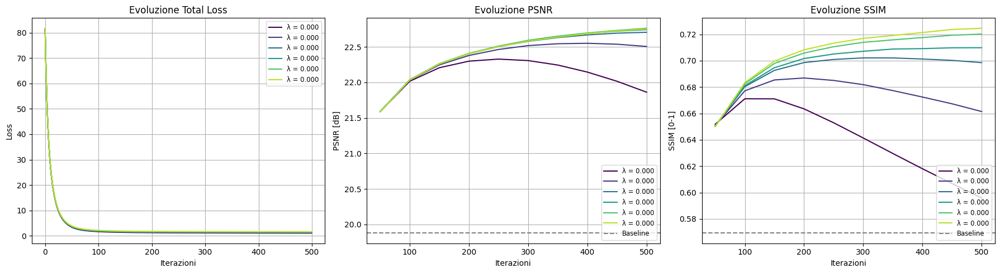

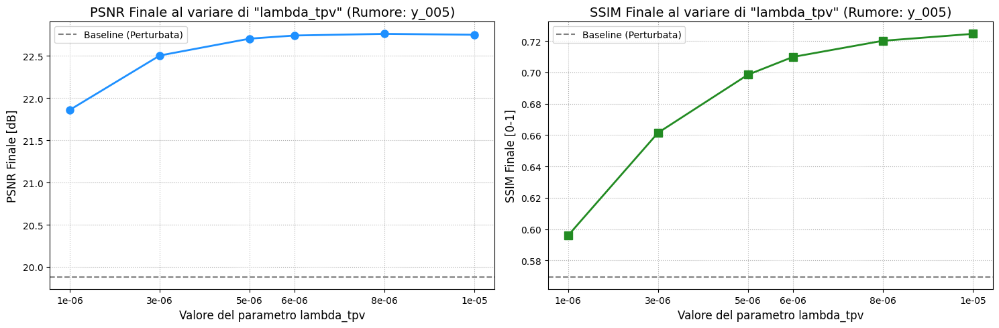

In [38]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm

# ==========================================
# ESECUZIONE MULTIPLA PER IL TUNING DI lambda_tpv
# ==========================================
# 1. Recupero 1 immagine e preparo il Ground Truth
sample = ds_degraded[1]
x_clean = pil_to_tensor(sample['x']).unsqueeze(0).to(DEVICE).float()

# Fissiamo il livello di rumore su cui fare il tuning
#noise_key = 'y_050'
y_noisy = pil_to_tensor(sample[noise_key]).unsqueeze(0).to(DEVICE).float()

# Calcoliamo le metriche di partenza
psnr_start, ssim_start = compute_metrics(y_noisy, x_clean)

# Generiamo una lista di valori non lineari per lambda_tpv per esplorare vari ordini di grandezza
#lambda_values = [0.0001,0.0002,0.0003,0.0004,0.0005,0.0006,0.0007, 0.001, 0.002]
lambda_values = np.linspace(0.000001, 0.00001,6)
for i in range(len(lambda_values)):
  lambda_values[i] = round(lambda_values[i],6)
results_lambda = {}

print(f"Avvio Tuning del parametro 'lambda_tpv' sull'immagine con rumore {noise_key}...\n")

for l_val in lambda_values:
    print(f"--- Ottimizzazione con lambda_tpv = {l_val:.3f} ---")

    # Eseguiamo la TpV mantenendo fissi tutti gli altri parametri
    x_reconstructed, history = deblur_denoise_tpv(
        y=y_noisy,
        K=blur,
        x_clean=x_clean,
        lambda_tpv=l_val,  # Varia il parametro lambda
        p=0.5,             # Teniamo fisso il parametro p (puoi cambiarlo se vuoi)
        num_iters=500,
        lr=0.005,
        device=DEVICE
    )

    results_lambda[l_val] = {
        'x_reconstructed': x_reconstructed,
        'history': history
    }

# ==========================================
# PLOT 1: EVOLUZIONE DELLE METRICHE NELLE ITERAZIONI
# ==========================================
fig, axs = plt.subplots(1, 3, figsize=(18, 5))

# Usiamo una palette di colori continua per i valori
colors = cm.viridis(np.linspace(0, 0.9, len(lambda_values)))

for i, l_val in enumerate(lambda_values):
    history = results_lambda[l_val]['history']
    c = colors[i]
    label = f'λ = {l_val:.3f}'

    # Tracciamo le curve per ogni esecuzione
    axs[0].plot(history['loss'], color=c, label=label)
    axs[1].plot(history['iters'], history['psnr'], color=c, label=label)
    axs[2].plot(history['iters'], history['ssim'], color=c, label=label)

axs[0].set_title('Evoluzione Total Loss')
axs[0].set_xlabel('Iterazioni')
axs[0].set_ylabel('Loss')
axs[0].legend(fontsize='small', loc='upper right')
axs[0].grid(True)

axs[1].axhline(y=psnr_start, color='gray', linestyle='--', label='Baseline')
axs[1].set_title('Evoluzione PSNR')
axs[1].set_xlabel('Iterazioni')
axs[1].set_ylabel('PSNR [dB]')
axs[1].legend(fontsize='small', loc='lower right')
axs[1].grid(True)

axs[2].axhline(y=ssim_start, color='gray', linestyle='--', label='Baseline')
axs[2].set_title('Evoluzione SSIM')
axs[2].set_xlabel('Iterazioni')
axs[2].set_ylabel('SSIM [0-1]')
axs[2].legend(fontsize='small', loc='lower right')
axs[2].grid(True)

plt.tight_layout()
plt.show()

# ==========================================
# PLOT 2: GRAFICI RIASSUNTIVI FINALI (IL TUNING VERO E PROPRIO)
# ==========================================
# Estraiamo l'ultimo valore raggiunto dalle metriche per ogni lambda_tpv testato
final_psnr = [results_lambda[l_val]['history']['psnr'][-1] for l_val in lambda_values]
final_ssim = [results_lambda[l_val]['history']['ssim'][-1] for l_val in lambda_values]

fig, axs = plt.subplots(1, 2, figsize=(15, 5))

# --- PSNR ---
axs[0].plot(lambda_values, final_psnr, marker='o', markersize=8, color='dodgerblue', linewidth=2)
axs[0].axhline(y=psnr_start, color='gray', linestyle='--', label='Baseline (Perturbata)')
axs[0].set_title(f'PSNR Finale al variare di "lambda_tpv" (Rumore: {noise_key})', fontsize=14)
axs[0].set_xlabel('Valore del parametro lambda_tpv', fontsize=12)
axs[0].set_ylabel('PSNR Finale [dB]', fontsize=12)
axs[0].grid(True, linestyle=':', which='both')
# Impostiamo l'asse X in scala logaritmica per distribuire equamente le magnitudini
#axs[0].set_xscale('log')
axs[0].set_xticks(lambda_values)
axs[0].set_xticklabels([str(v) for v in lambda_values])
axs[0].legend()

# --- SSIM ---
axs[1].plot(lambda_values, final_ssim, marker='s', markersize=8, color='forestgreen', linewidth=2)
axs[1].axhline(y=ssim_start, color='gray', linestyle='--', label='Baseline (Perturbata)')
axs[1].set_title(f'SSIM Finale al variare di "lambda_tpv" (Rumore: {noise_key})', fontsize=14)
axs[1].set_xlabel('Valore del parametro lambda_tpv', fontsize=12)
axs[1].set_ylabel('SSIM Finale [0-1]', fontsize=12)
axs[1].grid(True, linestyle=':', which='both')
# Impostiamo l'asse X in scala logaritmica
#axs[1].set_xscale('log')
axs[1].set_xticks(lambda_values)
axs[1].set_xticklabels([str(v) for v in lambda_values])
axs[1].legend()

plt.tight_layout()
plt.show()


## 3D "lambda_tpv" Evaluetion Over Multiple Images
With "p" fixed

Avvio Tuning su 260 immagini con p=0.5 al variare di lambda...
Totale esecuzioni previste: 1820

=== Elaborazione Immagine 1/260 ===
  > Ottimizzazione Lambda = 0.000 ... Fatto! (PSNR: 27.18 dB)
  > Ottimizzazione Lambda = 0.000 ... Fatto! (PSNR: 27.05 dB)
  > Ottimizzazione Lambda = 0.000 ... Fatto! (PSNR: 26.99 dB)
  > Ottimizzazione Lambda = 0.000 ... Fatto! (PSNR: 26.78 dB)
  > Ottimizzazione Lambda = 0.000 ... Fatto! (PSNR: 26.67 dB)
  > Ottimizzazione Lambda = 0.000 ... Fatto! (PSNR: 26.58 dB)
  > Ottimizzazione Lambda = 0.001 ... Fatto! (PSNR: 26.52 dB)
=== Elaborazione Immagine 2/260 ===
  > Ottimizzazione Lambda = 0.000 ... Fatto! (PSNR: 21.94 dB)
  > Ottimizzazione Lambda = 0.000 ... Fatto! (PSNR: 21.89 dB)
  > Ottimizzazione Lambda = 0.000 ... Fatto! (PSNR: 21.86 dB)
  > Ottimizzazione Lambda = 0.000 ... Fatto! (PSNR: 21.75 dB)
  > Ottimizzazione Lambda = 0.000 ... Fatto! (PSNR: 21.67 dB)
  > Ottimizzazione Lambda = 0.000 ... Fatto! (PSNR: 21.61 dB)
  > Ottimizzazione Lambda

/tmp/ipykernel_3572/1275835464.py:104: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


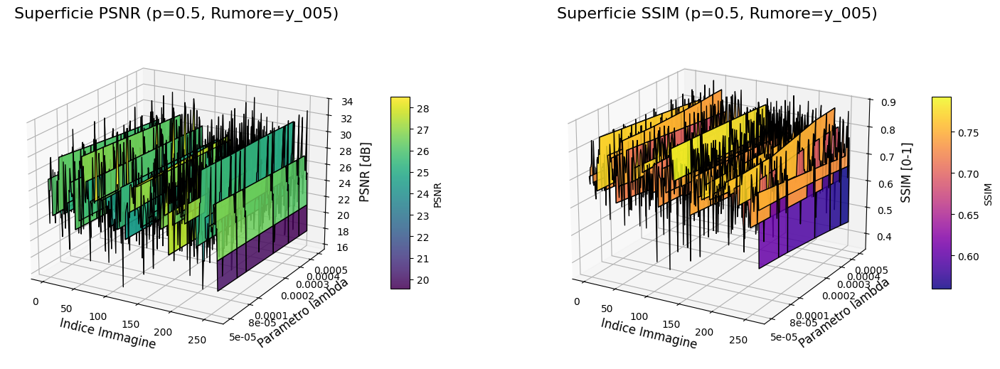

=== RISULTATI ROBUSTI GLOBALI ===

--- Analisi PSNR ---
Miglior Lambda (MEDIA):   5e-05 (PSNR medio: 25.85 ± 3.14 dB)
Miglior Lambda (MEDIANA): 5e-05 (PSNR mediano: 25.72 dB)
Miglior Lambda (MODA):    5e-05 (Ha vinto su 259 immagini su 260)
Dev. Std. dei Lambda scelti singolarmente dalle immagini: ± 0.0000

--- Analisi SSIM ---
Miglior Lambda (MEDIA):   5e-05 (SSIM medio: 0.7445 ± 0.0789)
Miglior Lambda (MEDIANA): 5e-05 (SSIM mediano: 0.7552)
Miglior Lambda (MODA):    5e-05 (Ha vinto su 212 immagini su 260)
Dev. Std. dei Lambda scelti singolarmente dalle immagini: ± 0.0002


In [30]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# ==========================================
# GRID SEARCH 3D: LAMBDA vs IMMAGINI (p = 0.5)
# ==========================================
p_val = 0.5
noise_key = 'y_005'

# Quante immagini diverse testare (es. le prime 5 del dataset)
num_images = len(final_dataset['test'])//2
ds_degraded=final_dataset['test']
image_indices = np.arange(num_images)

# Valori di lambda da esplorare
lambda_values = [0.00005,0.00008,0.0001,0.0002,0.0003,0.0004,0.0005]

# Creiamo le meshgrid (Asse X = Indice Immagine, Asse Y = Lambda_tpv)
I_mesh, L_mesh = np.meshgrid(image_indices, lambda_values)
Z_psnr = np.zeros_like(I_mesh, dtype=float)
Z_ssim = np.zeros_like(I_mesh, dtype=float)

print(f"Avvio Tuning su {num_images} immagini con p={p_val} al variare di lambda...")
print(f"Totale esecuzioni previste: {num_images * len(lambda_values)}\n")

for idx in range(num_images):
    # Recuperiamo l'immagine iesima
    sample = ds_degraded[int(idx)]
    x_clean = pil_to_tensor(sample['x']).unsqueeze(0).to(DEVICE).float()
    y_noisy = pil_to_tensor(sample[noise_key]).unsqueeze(0).to(DEVICE).float()

    print(f"=== Elaborazione Immagine {idx+1}/{num_images} ===")

    for i, l_val in enumerate(lambda_values):
        print(f"  > Ottimizzazione Lambda = {l_val:.3f} ...", end=" ")

        # Modifichiamo la stampa interna di deblur_denoise_tpv
        # (usiamo il codice base che hai già definito, ci penserà lui
        # a girare, l'output sarà pulito grazie al \r se avessi messo flush)
        x_reconstructed, history = deblur_denoise_tpv(
            y=y_noisy,
            K=blur,
            x_clean=x_clean,
            lambda_tpv=l_val,
            p=p_val,
            num_iters=100,
            lr=0.005,
            device=DEVICE
        )

        # Raccogliamo i risultati
        Z_psnr[i, idx] = history['psnr'][-1]
        Z_ssim[i, idx] = history['ssim'][-1]

        print(f"Fatto! (PSNR: {history['psnr'][-1]:.2f} dB)")

print("\nOttimizzazioni completate. Generazione dei grafici 3D...")

# ==========================================
# PLOT DELLE SUPERFICI 3D
# ==========================================
fig = plt.figure(figsize=(18, 7))

# Log10 per l'asse Lambda così da evitare schiacciamenti visivi
L_log = np.log10(L_mesh)

# --- GRAFICO 3D PSNR ---
ax1 = fig.add_subplot(121, projection='3d')
surf1 = ax1.plot_surface(I_mesh, L_log, Z_psnr, cmap='viridis', edgecolor='k', alpha=0.85)

ax1.set_title(f'Superficie PSNR (p={p_val}, Rumore={noise_key})', fontsize=16)
ax1.set_xlabel('Indice Immagine', fontsize=12)
ax1.set_ylabel('Parametro lambda', fontsize=12)
ax1.set_zlabel('PSNR [dB]', fontsize=12)

#ax1.set_xticks(image_indices)
ax1.set_yticks(np.log10(lambda_values))
ax1.set_yticklabels([str(v) for v in lambda_values])

# CORREZIONE: ax=ax1
fig.colorbar(surf1, ax=ax1, shrink=0.5, aspect=10, pad=0.1, label='PSNR')

# --- GRAFICO 3D SSIM ---
ax2 = fig.add_subplot(122, projection='3d')
surf2 = ax2.plot_surface(I_mesh, L_log, Z_ssim, cmap='plasma', edgecolor='k', alpha=0.85)

ax2.set_title(f'Superficie SSIM (p={p_val}, Rumore={noise_key})', fontsize=16)
ax2.set_xlabel('Indice Immagine', fontsize=12)
ax2.set_ylabel('Parametro lambda', fontsize=12)
ax2.set_zlabel('SSIM [0-1]', fontsize=12)

#ax2.set_xticks(image_indices)
ax2.set_yticks(np.log10(lambda_values))
ax2.set_yticklabels([str(v) for v in lambda_values])

# CORREZIONE: ax=ax2
fig.colorbar(surf2, ax=ax2, shrink=0.5, aspect=10, pad=0.1, label='SSIM')

# Regoliamo l'angolazione
ax1.view_init(elev=20, azim=-60)
ax2.view_init(elev=20, azim=-60)

plt.tight_layout()
plt.show()


from scipy import stats

# ==========================================
# ESTRAZIONE BEST PARAMETERS (MEDIA, MEDIANA, MODA, STD)
# ==========================================

# 1. Calcolo basato sulla MEDIA e calcolo DEVIAZIONE STANDARD delle metriche
mean_psnr = np.mean(Z_psnr, axis=1)
mean_ssim = np.mean(Z_ssim, axis=1)

std_psnr = np.std(Z_psnr, axis=1)
std_ssim = np.std(Z_ssim, axis=1)

best_lambda_mean_psnr = lambda_values[np.argmax(mean_psnr)]
best_lambda_mean_ssim = lambda_values[np.argmax(mean_ssim)]

# 2. Calcolo basato sulla MEDIANA
median_psnr = np.median(Z_psnr, axis=1)
median_ssim = np.median(Z_ssim, axis=1)

best_lambda_median_psnr = lambda_values[np.argmax(median_psnr)]
best_lambda_median_ssim = lambda_values[np.argmax(median_ssim)]

# 3. Calcolo basato sulla MODA
best_idx_per_img_psnr = np.argmax(Z_psnr, axis=0)
best_idx_per_img_ssim = np.argmax(Z_ssim, axis=0)

mode_psnr_idx = stats.mode(best_idx_per_img_psnr, keepdims=False).mode
mode_ssim_idx = stats.mode(best_idx_per_img_ssim, keepdims=False).mode

best_lambda_mode_psnr = lambda_values[mode_psnr_idx]
best_lambda_mode_ssim = lambda_values[mode_ssim_idx]

# 4. Deviazione standard dei Lambda ottimali
best_lambdas_psnr_array = np.array([lambda_values[i] for i in best_idx_per_img_psnr])
best_lambdas_ssim_array = np.array([lambda_values[i] for i in best_idx_per_img_ssim])

std_lambda_psnr = np.std(best_lambdas_psnr_array)
std_lambda_ssim = np.std(best_lambdas_ssim_array)


print("=== RISULTATI ROBUSTI GLOBALI ===")

print("\n--- Analisi PSNR ---")
# Stampiamo il PSNR medio con il suo margine di errore (± deviazione standard)
print(f"Miglior Lambda (MEDIA):   {best_lambda_mean_psnr} (PSNR medio: {np.max(mean_psnr):.2f} ± {std_psnr[np.argmax(mean_psnr)]:.2f} dB)")
print(f"Miglior Lambda (MEDIANA): {best_lambda_median_psnr} (PSNR mediano: {np.max(median_psnr):.2f} dB)")
print(f"Miglior Lambda (MODA):    {best_lambda_mode_psnr} (Ha vinto su {np.sum(best_idx_per_img_psnr == mode_psnr_idx)} immagini su {num_images})")
print(f"Dev. Std. dei Lambda scelti singolarmente dalle immagini: ± {std_lambda_psnr:.4f}")

print("\n--- Analisi SSIM ---")
print(f"Miglior Lambda (MEDIA):   {best_lambda_mean_ssim} (SSIM medio: {np.max(mean_ssim):.4f} ± {std_ssim[np.argmax(mean_ssim)]:.4f})")
print(f"Miglior Lambda (MEDIANA): {best_lambda_median_ssim} (SSIM mediano: {np.max(median_ssim):.4f})")
print(f"Miglior Lambda (MODA):    {best_lambda_mode_ssim} (Ha vinto su {np.sum(best_idx_per_img_ssim == mode_ssim_idx)} immagini su {num_images})")
print(f"Dev. Std. dei Lambda scelti singolarmente dalle immagini: ± {std_lambda_ssim:.4f}")

